# Semantic Segmentation (Option 1)

Loading Dataset:

In [1]:
import zipfile
from google.colab import drive

drive.mount('/content/drive/')


Mounted at /content/drive/


In [2]:
!unzip '/content/drive/MyDrive/A3_Dataset.zip' -d '/content/'

Archive:  /content/drive/MyDrive/A3_Dataset.zip
   creating: /content/A3_Dataset/
   creating: /content/A3_Dataset/dataset1/
   creating: /content/A3_Dataset/dataset1/annotations_prepped_test/
  inflating: /content/A3_Dataset/dataset1/annotations_prepped_test/0016E5_07959.png  
  inflating: /content/A3_Dataset/dataset1/annotations_prepped_test/0016E5_07961.png  
  inflating: /content/A3_Dataset/dataset1/annotations_prepped_test/0016E5_07963.png  
  inflating: /content/A3_Dataset/dataset1/annotations_prepped_test/0016E5_07965.png  
  inflating: /content/A3_Dataset/dataset1/annotations_prepped_test/0016E5_07967.png  
  inflating: /content/A3_Dataset/dataset1/annotations_prepped_test/0016E5_07969.png  
  inflating: /content/A3_Dataset/dataset1/annotations_prepped_test/0016E5_07971.png  
  inflating: /content/A3_Dataset/dataset1/annotations_prepped_test/0016E5_07973.png  
  inflating: /content/A3_Dataset/dataset1/annotations_prepped_test/0016E5_07975.png  
  inflating: /content/A3_Dataset/

Dividing Data into train and validation folders:

In [3]:
import os
import numpy as np
import shutil
import pandas as pd

def train_validation_split():

    root_dir = "/content/A3_Dataset/dataset1"
    classes_dir = ["annotations_prepped_train","images_prepped_train"]
    processed_dir = '/content/A3_Dataset/dataset1'

    
    val_ratio = 0.20

    for cls in classes_dir:
        # Creating partitions of the data after shuffeling
        # print(" Class Name " + cls + ": ")
        # Folder to copy images from
        src = processed_dir +"//" + cls  

        allFileNames = os.listdir(src)
        np.random.shuffle(allFileNames)
        train_FileNames, val_FileNames = np.split(np.array(allFileNames),[int(len(allFileNames) * (1 - (val_ratio)))])

        train_FileNames = [src + '//' + name for name in train_FileNames.tolist()]
        val_FileNames = [src + '//' + name for name in val_FileNames.tolist()]

        print('Total images: '+ str(len(allFileNames)))
        print('Training: '+ str(len(train_FileNames)))
        print('Validation: '+ str(len(val_FileNames)))

        os.makedirs(root_dir + '/train//' + cls)
        os.makedirs(root_dir + '/validation//' + cls)

        # Copy-pasting images
        for name in train_FileNames:
            shutil.copy(name, root_dir + '/train//' + cls)

        for name in val_FileNames:
            shutil.copy(name, root_dir + '/validation//' + cls)

train_validation_split()

Total images: 367
Training: 293
Validation: 74
Total images: 367
Training: 293
Validation: 74


Loading Libraries:

In [26]:
import numpy as np
import os
import matplotlib.pyplot as plot
from PIL import Image
import cv2
import random
import seaborn as sns
from keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import Input, Conv2D, Activation, Add, Conv2DTranspose
from tensorflow.keras.applications.vgg16 import VGG16
import imgaug as ia
import imgaug.augmenters as iaa
from skimage import color, exposure
from google.colab.patches import cv2_imshow
import glob
import itertools
import matplotlib.pyplot as plt
from keras import Model, layers
from keras.applications import vgg16
from keras.layers import Input, Conv2D, BatchNormalization, Activation, Reshape, MaxPool2D, concatenate, UpSampling2D
from keras import backend as K
from keras.callbacks import ModelCheckpoint, TensorBoard
from keras import optimizers
import math



Importing images from dataset:

Data Augmentation:

In [5]:
seq = iaa.Sequential([
    iaa.Crop(px=(0, 16)), # crop images from each side by 0 to 16px (randomly chosen)
    iaa.Fliplr(0.5), # horizontally flip 50% of the images
    iaa.GaussianBlur(sigma=(0, 3.0)) # blur images with a sigma of 0 to 3.0
])

def augment_seg( img , seg  ):
	
	aug_det = seq.to_deterministic() 
	image_aug = aug_det.augment_image( img )

	segmap = ia.SegmentationMapOnImage( seg , nb_classes=np.max(seg)+1 , shape=img.shape )
	segmap_aug = aug_det.augment_segmentation_maps( segmap )
	segmap_aug = segmap_aug.get_arr_int()

	return image_aug , segmap_aug

Loading image files from directories:

In [6]:

def getImageArr(im):

    img = im.astype(np.float32)

    img[:, :, 0] -= 103.939
    img[:, :, 1] -= 116.779
    img[:, :, 2] -= 123.68

    return img


def getSegmentationArr(seg, nClasses, input_height, input_width):

    seg_labels = np.zeros((input_height, input_width, nClasses))

    for c in range(nClasses):
        seg_labels[:, :, c] = (seg == c).astype(int)

    seg_labels = np.reshape(seg_labels, (-1, nClasses))
    return seg_labels


def imageSegmentationGenerator(images_path, segs_path, batch_size,
                               n_classes, input_height, input_width):

    assert images_path[-1] == '/'
    assert segs_path[-1] == '/'

    images = sorted(glob.glob(images_path + "*.jpg") +
                    glob.glob(images_path + "*.png") + glob.glob(images_path + "*.jpeg"))

    segmentations = sorted(glob.glob(segs_path + "*.jpg") +
                           glob.glob(segs_path + "*.png") + glob.glob(segs_path + "*.jpeg"))

    zipped = itertools.cycle(zip(images, segmentations))

    while True:
        X = []
        Y = []
        for _ in range(batch_size):
            im, seg = zipped.__next__()
            im = cv2.imread(im, 1)
            seg = cv2.imread(seg, 0)

            assert im.shape[:2] == seg.shape[:2]

            assert im.shape[0] >= input_height and im.shape[1] >= input_width

            xx = random.randint(0, im.shape[0] - input_height)
            yy = random.randint(0, im.shape[1] - input_width)

            im = im[xx:xx + input_height, yy:yy + input_width]
            seg = seg[xx:xx + input_height, yy:yy + input_width]
            im, seg = augment_seg( im , seg  )
            X.append(getImageArr(im))
            Y.append(
                getSegmentationArr(
                    seg,
                    n_classes,
                    input_height,
                    input_width))
        yield np.array(X), np.array(Y)



In [7]:
ds_train = imageSegmentationGenerator("/content/A3_Dataset/dataset1/train/images_prepped_train/",
                                   "/content/A3_Dataset/dataset1/train/annotations_prepped_train/", batch_size=16, n_classes=11, input_height=320, input_width=320)
ds_val = imageSegmentationGenerator("/content/A3_Dataset/dataset1/validation/images_prepped_train/",
                                   "/content/A3_Dataset/dataset1/validation/annotations_prepped_train/", batch_size=16, n_classes=11, input_height=320, input_width=320)
ds_test = imageSegmentationGenerator("/content/A3_Dataset/dataset1/images_prepped_test/",
                                   "/content/A3_Dataset/dataset1/annotations_prepped_test/", batch_size=16, n_classes=11, input_height=320, input_width=320)


In [ ]:
train_image=imageSegmentationGenerator.flow_from_dataframe(dataframe=ds_train,x_col='filepaths', y_col='labels',target_size=(320,320),batch_size=16,subset='training',random_seed=42)
test_image = imageSegmentationGenerator.flow_from_dataframe(dataframe=ds_test, x_col='filepaths',y_col='labels',target_size=(320,320),batch_size=32)
valid_image = imageSegmentationGenerator.flow_from_dataframe(dataframe=ds_valid,x_col='filepaths',y_col='labels',subset='training',target_size=(320,320), batch_size=32)

Defining Metrics:

In [8]:
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

def dice_coef(y_true, y_pred):
    smooth=1
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def specificity(y_true, y_pred):
    neg_y_true = 1 - y_true
    neg_y_pred = 1 - y_pred
    fp = K.sum(neg_y_true * y_pred)
    tn = K.sum(neg_y_true * neg_y_pred)
    specificity = tn / (tn + fp + K.epsilon())
    return specificity


# U-Net with VGG16 Backbone

In [9]:
def UNet_VGG16(nClasses, input_height, input_width):
    assert input_height % 32 == 0
    assert input_width % 32 == 0

    img_input = Input(shape=(input_height, input_width, 3))

    vgg_streamlined = vgg16.VGG16(
        include_top=False,
        weights='imagenet', input_tensor=img_input)
    assert isinstance(vgg_streamlined, Model)

    o = UpSampling2D((2, 2))(vgg_streamlined.output)
    o = concatenate([vgg_streamlined.get_layer(
        name="block4_pool").output, o], axis=-1)
    o = Conv2D(512, (3, 3), padding="same")(o)
    o = BatchNormalization()(o)

    o = UpSampling2D((2, 2))(o)
    o = concatenate([vgg_streamlined.get_layer(
        name="block3_pool").output, o], axis=-1)
    o = Conv2D(256, (3, 3), padding="same")(o)
    o = BatchNormalization()(o)

    o = UpSampling2D((2, 2))(o)
    o = concatenate([vgg_streamlined.get_layer(
        name="block2_pool").output, o], axis=-1)
    o = Conv2D(128, (3, 3), padding="same")(o)
    o = BatchNormalization()(o)

    o = UpSampling2D((2, 2))(o)
    o = concatenate([vgg_streamlined.get_layer(
        name="block1_pool").output, o], axis=-1)
    o = Conv2D(64, (3, 3), padding="same")(o)
    o = BatchNormalization()(o)

    o = UpSampling2D((2, 2))(o)
    o = Conv2D(64, (3, 3), padding="same")(o)
    o = BatchNormalization()(o)

    o = Conv2D(nClasses, (1, 1), padding="same")(o)
    o = BatchNormalization()(o)
    o = Activation("relu")(o)

    o = Reshape((-1, nClasses))(o)
    o = Activation("softmax")(o)

    model = Model(inputs=img_input, outputs=o)
    return model



Loading the best saved model:





In [ ]:
model = UNet_VGG16(11, 320, 320)
from keras.utils.vis_utils import plot_model
plot_model(model, show_shapes=True, to_file='/content/drive/MyDrive/Assignment 3/model_unet_VGG16_2.png')
print(len(model.layers))
model.summary()

43
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 320, 320, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 320, 320, 64  1792        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 320, 320, 64  36928       ['block1_conv1[0][0]']           
                                )                                                        

In [ ]:
model.compile(
    loss='categorical_crossentropy',
    optimizer="adam",
    metrics=['acc',f1_m,precision_m, recall_m,dice_coef, specificity])


In [ ]:
checkpoint = ModelCheckpoint(
    filepath="/content/drive/MyDrive/Assignment 3/UNET_VGG16_2.h5",
    monitor='acc',
    mode='auto',
    verbose=1,
    save_best_only='True')

Training the model:

In [ ]:
history_UNET_VGG16_2 = model.fit(ds_train,
                steps_per_epoch=math.ceil(367. / 4),
                epochs=50, callbacks=checkpoint,
                verbose=2,
                validation_data=ds_val,
                validation_steps=8,
                shuffle=True)

Epoch 1/50
92/92 - 152s - loss: 1.4466 - acc: 0.6123 - f1_m: 0.1890 - precision_m: 0.7892 - recall_m: 0.1104 - dice_coef: 0.2763 - specificity: 0.9274 - val_loss: 1.3900 - val_acc: 0.6103 - val_f1_m: 0.4372 - val_precision_m: 0.8247 - val_recall_m: 0.2999 - val_dice_coef: 0.3225 - val_specificity: 0.9319 - 152s/epoch - 2s/step
Epoch 2/50
92/92 - 149s - loss: 1.3662 - acc: 0.6217 - f1_m: 0.3069 - precision_m: 0.8343 - recall_m: 0.1924 - dice_coef: 0.3050 - specificity: 0.9302 - val_loss: 1.4254 - val_acc: 0.5908 - val_f1_m: 0.4947 - val_precision_m: 0.8169 - val_recall_m: 0.3567 - val_dice_coef: 0.3340 - val_specificity: 0.9330 - 149s/epoch - 2s/step
Epoch 3/50
92/92 - 148s - loss: 1.3141 - acc: 0.6254 - f1_m: 0.4073 - precision_m: 0.8578 - recall_m: 0.2702 - dice_coef: 0.3256 - specificity: 0.9322 - val_loss: 1.3674 - val_acc: 0.6090 - val_f1_m: 0.4964 - val_precision_m: 0.8161 - val_recall_m: 0.3574 - val_dice_coef: 0.3379 - val_specificity: 0.9334 - 148s/epoch - 2s/step
Epoch 4/50
92

In [ ]:
np.save('/content/drive/MyDrive/Assignment 3/UNET_VGG16_hist.npy',history_UNET_VGG16_2.history)

Loading best saved model:

In [13]:
dependencies = {
    'f1_m': f1_m,
    'precision_m':precision_m,
    'recall_m':recall_m,
    'dice':dice_coef,
    'specificity': specificity

}

In [14]:
from tensorflow.keras.models import load_model
VGG_UNet = load_model('/content/drive/MyDrive/Assignment 3/UNET_VGG16.h5', custom_objects=dependencies)

Evaluating Model:

In [ ]:
VGG_UNet.evaluate(ds_test, steps = 200)

200/200 [==============================] - 220s 1s/step - loss: 1.0258 - acc: 0.6556 - f1_m: 0.6252 - precision_m: 0.7760 - recall_m: 0.5240 - dice_coef: 0.5464 - specificity: 0.9542


[1.0257686376571655,
 0.6556154489517212,
 0.6251777410507202,
 0.7760095000267029,
 0.5239904522895813,
 0.5464267134666443,
 0.9541836380958557]

In [29]:
history_dict=np.load('/content/drive/MyDrive/Assignment 3/UNET_VGG16_hist.npy',allow_pickle='TRUE').item()

Training Graphs:

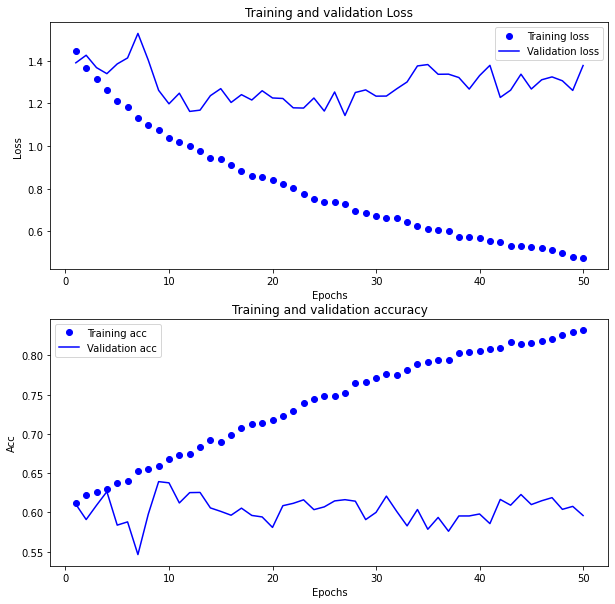

In [30]:
import matplotlib.pyplot as plt

loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']

epochs_x = range(1, len(loss_values) + 1)
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plt.plot(epochs_x, loss_values, 'bo', label='Training loss')
plt.plot(epochs_x, val_loss_values, 'b', label='Validation loss')
plt.title('Training and validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.subplot(2,1,2)
acc_values = history_dict['acc']
val_acc_values = history_dict['val_acc']
plt.plot(epochs_x, acc_values, 'bo', label='Training acc')
plt.plot(epochs_x, val_acc_values, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Acc')
plt.legend()
plt.show()

Qualitative Analysis:

1/5 /content/drive/MyDrive/Assignment 3/sample/images/0016E5_07959.png


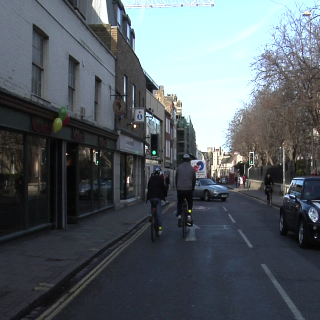

Ground Truth in the form of segmentation mask:


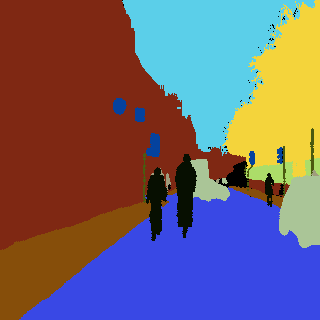

Ground Truth image Super-imposed on original image


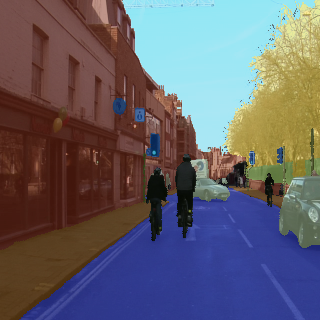

Predicted Image mask:


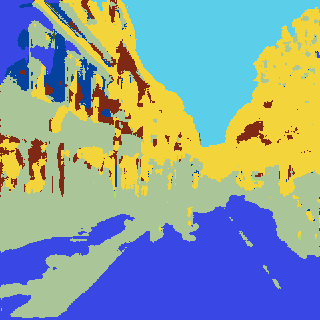

Predicted image Super-imposed on original image


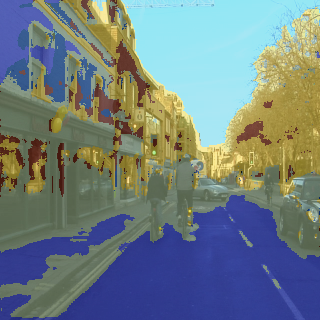

2/5 /content/drive/MyDrive/Assignment 3/sample/images/0016E5_07961.png


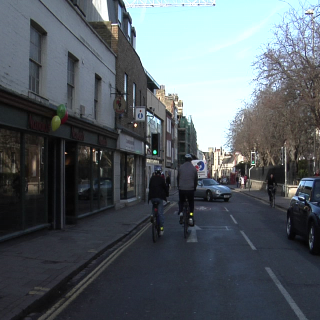

Ground Truth in the form of segmentation mask:


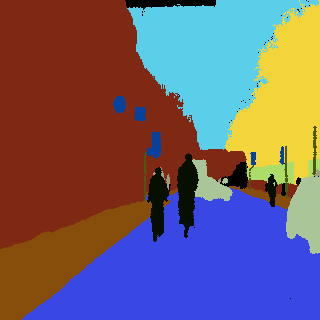

Ground Truth image Super-imposed on original image


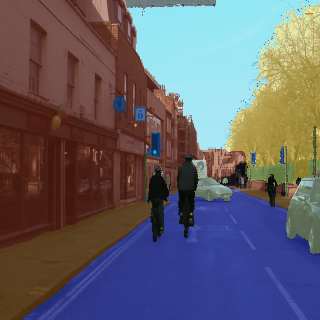

Predicted Image mask:


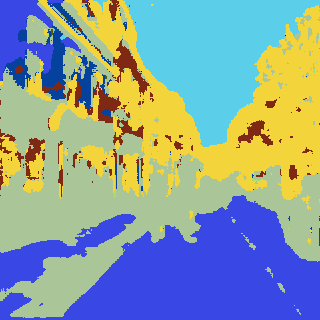

Predicted image Super-imposed on original image


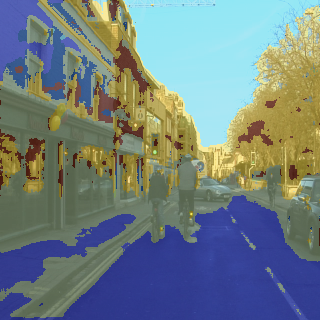

3/5 /content/drive/MyDrive/Assignment 3/sample/images/0016E5_07963.png


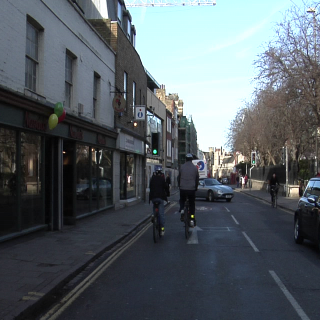

Ground Truth in the form of segmentation mask:


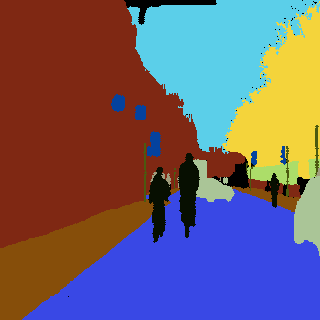

Ground Truth image Super-imposed on original image


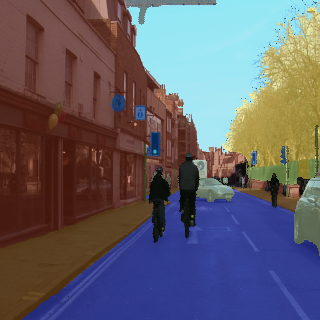

Predicted Image mask:


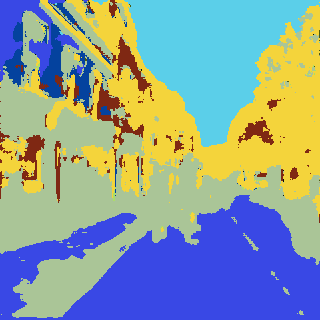

Predicted image Super-imposed on original image


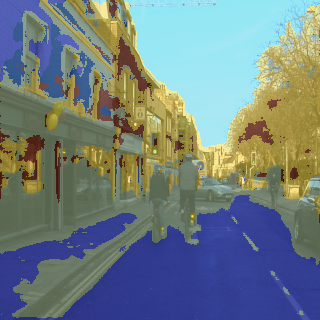

4/5 /content/drive/MyDrive/Assignment 3/sample/images/0016E5_08087.png


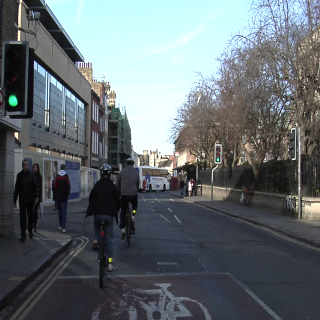

Ground Truth in the form of segmentation mask:


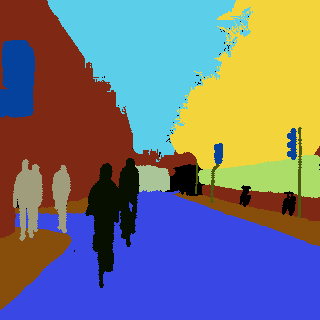

Ground Truth image Super-imposed on original image


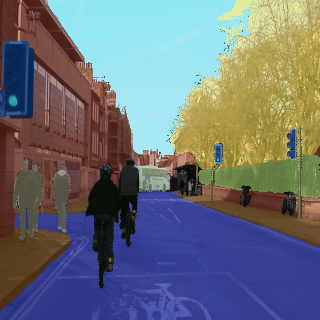

Predicted Image mask:


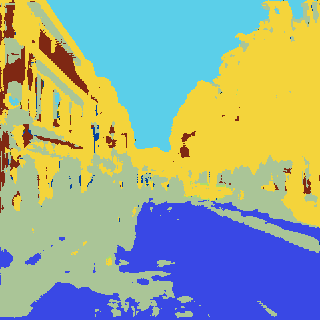

Predicted image Super-imposed on original image


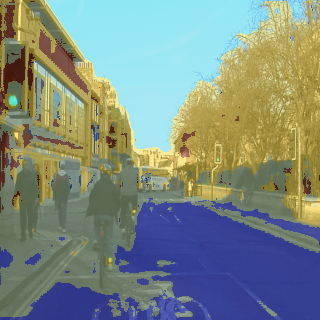

5/5 /content/drive/MyDrive/Assignment 3/sample/images/0016E5_08159.png


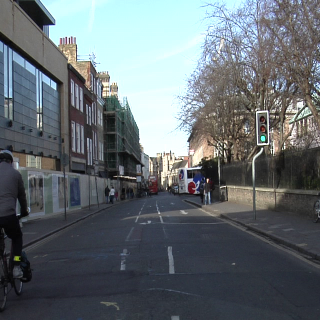

Ground Truth in the form of segmentation mask:


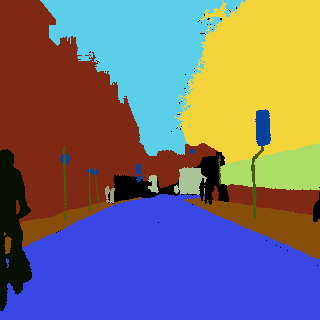

Ground Truth image Super-imposed on original image


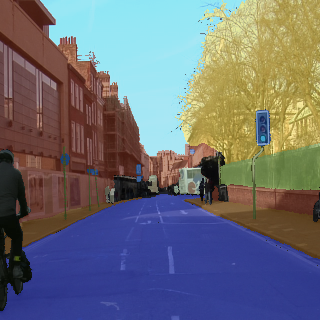

Predicted Image mask:


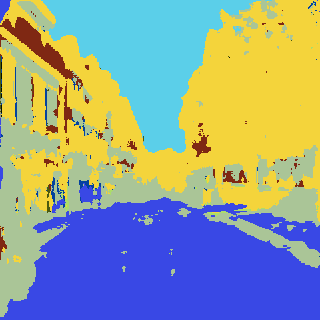

Predicted image Super-imposed on original image


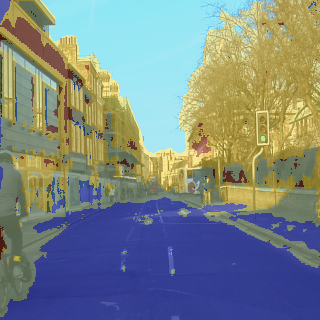

In [15]:
from skimage import color
from skimage import segmentation
images_path = "/content/drive/MyDrive/Assignment 3/sample/images/"
segs_path = "/content/drive/MyDrive/Assignment 3/sample/annotations/"
input_height = 320
input_width = 320
n_classes = 11
colors = [
    (random.randint(
        0, 255), random.randint(
            0, 255), random.randint(
                0, 255)) for _ in range(11)]



def label2color(colors, n_classes, seg):
    seg_color = np.zeros((seg.shape[0], seg.shape[1], 3))
    for c in range(n_classes):
        seg_color[:, :, 0] += ((seg == c) *
                               (colors[c][0])).astype('uint8')
        seg_color[:, :, 1] += ((seg == c) *
                               (colors[c][1])).astype('uint8')
        seg_color[:, :, 2] += ((seg == c) *
                               (colors[c][2])).astype('uint8')
    seg_color = seg_color.astype(np.uint8)
    return seg_color


def getcenteroffset(shape, input_height, input_width):
    short_edge = min(shape[:2])
    xx = int((shape[0] - short_edge) / 2)
    yy = int((shape[1] - short_edge) / 2)
    return xx, yy


images = sorted(
    glob.glob(
        images_path +
        "*.jpg") +
    glob.glob(
        images_path +
        "*.png") +
    glob.glob(
        images_path +
        "*.jpeg"))
segmentations = sorted(glob.glob(segs_path + "*.jpg") +
                       glob.glob(segs_path + "*.png") + glob.glob(segs_path + "*.jpeg"))
for i, (imgName, segName) in enumerate(zip(images, segmentations)):

    print("%d/%d %s" % (i + 1, len(images), imgName))

    im = cv2.imread(imgName, 1)
    # im=cv2.resize(im,(input_height,input_width))
    xx, yy = getcenteroffset(im.shape, input_height, input_width)
    im = im[xx:xx + input_height, yy:yy + input_width, :]

    seg = cv2.imread(segName, 0)
    # seg= cv2.resize(seg,interpolation=cv2.INTER_NEAREST)
    seg = seg[xx:xx + input_height, yy:yy + input_width]

    pr = VGG_UNet.predict(np.expand_dims(getImageArr(im), 0))[0]
    pr = pr.reshape((input_height, input_width, n_classes)).argmax(axis=2)

    cv2_imshow( im)
    pr_mask = label2color(colors, n_classes, pr)
    im_mask = label2color(colors, n_classes, seg)

    print ('Ground Truth in the form of segmentation mask:')
    cv2_imshow (im_mask)
    print ('Ground Truth image Super-imposed on original image')
    dst = cv2.addWeighted(im_mask, 0.5, im, 0.5, 0)
    cv2_imshow (dst)
    print ('Predicted Image mask:')
    cv2_imshow(pr_mask )
    print ('Predicted image Super-imposed on original image')
    dst = cv2.addWeighted(pr_mask, 0.5, im, 0.5, 0)
    cv2_imshow (dst)

## UNET with Xception Backbone

In [10]:
from keras.preprocessing.image import load_img
from keras import Model
from keras.callbacks import  ModelCheckpoint
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout,BatchNormalization
from keras.layers import Conv2D, Concatenate, MaxPooling2D
from keras.layers import UpSampling2D, Dropout, BatchNormalization
from tqdm import tqdm_notebook
from keras import initializers
from keras import regularizers
from keras import constraints
from keras.utils import conv_utils
from keras.utils.data_utils import get_file
from keras import backend as K
from keras.layers import LeakyReLU
from keras.layers import ZeroPadding2D
from keras.losses import binary_crossentropy
import keras.callbacks as callbacks
from keras.callbacks import Callback
from keras.applications.xception import Xception

In [16]:
def convolution_block(x, filters, size, strides=(1,1), padding='same', activation=True):
    x = Conv2D(filters, size, strides=strides, padding=padding)(x)
    x = BatchNormalization()(x)
    if activation == True:
        x = LeakyReLU(alpha=0.1)(x)
    return x

def residual_block(blockInput, num_filters=16):
    x = LeakyReLU(alpha=0.1)(blockInput)
    x = BatchNormalization()(x)
    blockInput = BatchNormalization()(blockInput)
    x = convolution_block(x, num_filters, (3,3) )
    x = convolution_block(x, num_filters, (3,3), activation=False)
    x = Add()([x, blockInput])
    return x

In [17]:
def UNET_Xception(input_shape=(None, None, 3)):

    backbone = Xception(input_shape=input_shape,weights='imagenet',include_top=False)
    input = backbone.input
    start_neurons = 16

    conv4 = backbone.layers[121].output
    conv4 = LeakyReLU(alpha=0.1)(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(0.1)(pool4)
    
     # Middle
    convm = Conv2D(start_neurons * 32, (3, 3), activation=None, padding="same")(pool4)
    convm = residual_block(convm,start_neurons * 32)
    convm = residual_block(convm,start_neurons * 32)
    convm = LeakyReLU(alpha=0.1)(convm)
    
    deconv4 = Conv2DTranspose(start_neurons * 16, (3, 3), strides=(2, 2), padding="same")(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.1)(uconv4)
    
    uconv4 = Conv2D(start_neurons * 16, (3, 3), activation=None, padding="same")(uconv4)
    uconv4 = residual_block(uconv4,start_neurons * 16)
    uconv4 = residual_block(uconv4,start_neurons * 16)
    uconv4 = LeakyReLU(alpha=0.1)(uconv4)
    
    deconv3 = Conv2DTranspose(start_neurons * 8, (3, 3), strides=(2, 2), padding="same")(uconv4)
    conv3 = backbone.layers[31].output
    uconv3 = concatenate([deconv3, conv3])    
    uconv3 = Dropout(0.1)(uconv3)
    
    uconv3 = Conv2D(start_neurons * 8, (3, 3), activation=None, padding="same")(uconv3)
    uconv3 = residual_block(uconv3,start_neurons * 8)
    uconv3 = residual_block(uconv3,start_neurons * 8)
    uconv3 = LeakyReLU(alpha=0.1)(uconv3)

    deconv2 = Conv2DTranspose(start_neurons * 4, (3, 3), strides=(2, 2), padding="same")(uconv3)
    conv2 = backbone.layers[21].output
    conv2 = ZeroPadding2D(((1,0),(1,0)))(conv2)
    uconv2 = concatenate([deconv2, conv2])
        
    uconv2 = Dropout(0.1)(uconv2)
    uconv2 = Conv2D(start_neurons * 4, (3, 3), activation=None, padding="same")(uconv2)
    uconv2 = residual_block(uconv2,start_neurons * 4)
    uconv2 = residual_block(uconv2,start_neurons * 4)
    uconv2 = LeakyReLU(alpha=0.1)(uconv2)
    
    deconv1 = Conv2DTranspose(start_neurons * 2, (3, 3), strides=(2, 2), padding="same")(uconv2)
    conv1 = backbone.layers[11].output
    conv1 = ZeroPadding2D(((3,0),(3,0)))(conv1)
    uconv1 = concatenate([deconv1, conv1])
    
    uconv1 = Dropout(0.1)(uconv1)
    uconv1 = Conv2D(start_neurons * 2, (3, 3), activation=None, padding="same")(uconv1)
    uconv1 = residual_block(uconv1,start_neurons * 2)
    uconv1 = residual_block(uconv1,start_neurons * 2)
    uconv1 = LeakyReLU(alpha=0.1)(uconv1)
    
    uconv0 = Conv2DTranspose(start_neurons * 1, (3, 3), strides=(2, 2), padding="same")(uconv1)   
    uconv0 = Dropout(0.1)(uconv0)
    uconv0 = Conv2D(start_neurons * 1, (3, 3), activation=None, padding="same")(uconv0)
    uconv0 = residual_block(uconv0,start_neurons * 1)
    uconv0 = residual_block(uconv0,start_neurons * 1)
    uconv0 = LeakyReLU(alpha=0.1)(uconv0)
    
    uconv0 = Dropout(0.1/2)(uconv0)
    output_layer = Conv2D(11, (1,1), padding="same", activation="sigmoid")(uconv0)    
    o = Reshape((-1, 11))(output_layer)
    o = Activation("softmax")(o)
    model = Model(input, o)
    # model.name = 'u-xception'

    return model

In [13]:
img_size = 320
model_2 = UNET_Xception(input_shape=(img_size,img_size,3))
print(len(model_2.layers))
model_2.summary()

83697664/83683744 [==============================] - 1s 0us/step
265
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 320, 320, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 159, 159, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 159, 159, 32  128        ['block1_conv1[0][0]']           
 ation)                  

In [14]:
model_2.compile(
    loss='categorical_crossentropy',
    optimizer="adam",
    metrics=['acc',f1_m,precision_m, recall_m,dice_coef, specificity])

In [15]:
checkpoint = ModelCheckpoint(
    filepath="/content/drive/MyDrive/Assignment 3/unet_xception.h5",
    monitor='acc',
    mode='auto',
    save_best_only='True')

Training Model:

In [16]:
history_unet_xception = model_2.fit(ds_train,
                steps_per_epoch=367/4,
                epochs=50, callbacks=checkpoint,
                verbose=2,
                validation_data=ds_val,
                validation_steps=8,
                shuffle=True)

Epoch 1/50


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


91/91 - 276s - loss: 1.9682 - acc: 0.5790 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+00 - dice_coef: 0.1310 - specificity: 0.9132 - val_loss: 1.8931 - val_acc: 0.4741 - val_f1_m: 0.0000e+00 - val_precision_m: 0.0000e+00 - val_recall_m: 0.0000e+00 - val_dice_coef: 0.1453 - val_specificity: 0.9146 - 276s/epoch - 3s/step
Epoch 2/50
91/91 - 244s - loss: 1.8176 - acc: 0.6483 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+00 - dice_coef: 0.1534 - specificity: 0.9154 - val_loss: 1.8250 - val_acc: 0.5409 - val_f1_m: 0.0000e+00 - val_precision_m: 0.0000e+00 - val_recall_m: 0.0000e+00 - val_dice_coef: 0.1568 - val_specificity: 0.9157 - 244s/epoch - 3s/step
Epoch 3/50
91/91 - 244s - loss: 1.7482 - acc: 0.6595 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+00 - dice_coef: 0.1647 - specificity: 0.9165 - val_loss: 1.7864 - val_acc: 0.5349 - val_f1_m: 0.0000e+00 - val_precision_m: 0.0000e+00 - val_recall_m: 0.0000e+00 - val_dice_coef: 0.1631 -

In [17]:
model_2.save_weights('/content/drive/MyDrive/Assignment 3/my_model_weights.h5')

In [18]:
np.save('/content/drive/MyDrive/Assignment 3/UNET_xception_hist.npy',history_unet_xception.history)

Loading best saved model:

In [20]:
from tensorflow.keras.models import load_model
dependencies = {
    'f1_m': f1_m,
    'precision_m':precision_m,
    'recall_m':recall_m,
    'dice_coef':dice_coef,
    'specificity': specificity

}
UNet_XCeption = load_model('/content/drive/MyDrive/Assignment 3/unet_xception.h5', custom_objects=dependencies)

In [24]:
plot_model(UNet_XCeption, show_shapes=True, to_file='/content/drive/MyDrive/Assignment 3/UNet_XCeption.png')

Evaluating Model:

In [19]:
model_2.evaluate(ds_test, steps = 140)

140/140 [==============================] - 173s 1s/step - loss: 1.7322 - acc: 0.7365 - f1_m: 0.0000e+00 - precision_m: 0.0000e+00 - recall_m: 0.0000e+00 - dice_coef: 0.1805 - specificity: 0.9180


[1.732177972793579,
 0.7364522814750671,
 0.0,
 0.0,
 0.0,
 0.18049517273902893,
 0.9180330634117126]

In [ ]:
history_dict=np.load('/content/drive/MyDrive/Assignment 3/UNET_xception_history.npy',allow_pickle='TRUE').item()

Training Graphs:

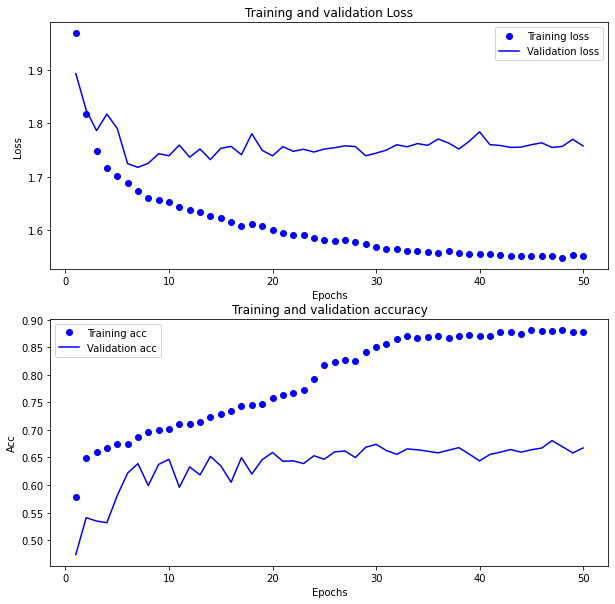

In [20]:
import matplotlib.pyplot as plt
history_dict = history_unet_xception.history
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']

epochs_x = range(1, len(loss_values) + 1)
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plt.plot(epochs_x, loss_values, 'bo', label='Training loss')
plt.plot(epochs_x, val_loss_values, 'b', label='Validation loss')
plt.title('Training and validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.subplot(2,1,2)
acc_values = history_dict['acc']
val_acc_values = history_dict['val_acc']
plt.plot(epochs_x, acc_values, 'bo', label='Training acc')
plt.plot(epochs_x, val_acc_values, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Acc')
plt.legend()
plt.show()

Qualitative Results:

1/5 /content/drive/MyDrive/Assignment 3/sample/images/0016E5_07959.png


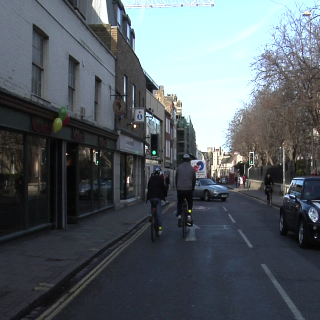

Ground Truth in the form of segmentation mask:


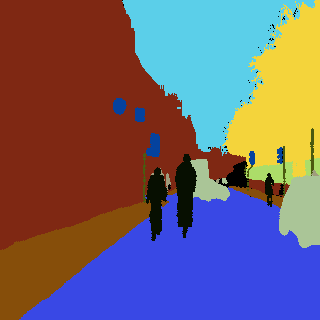

Ground Truth image Super-imposed on original image


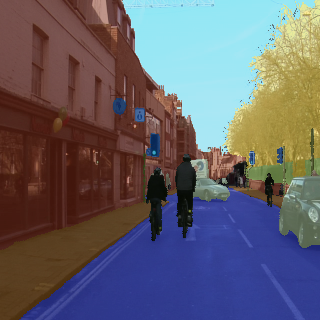

Pridicted Image mask:


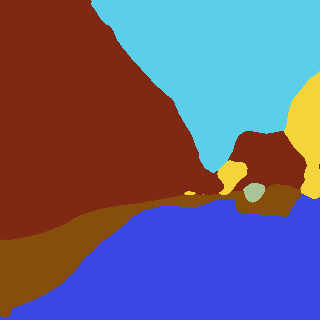

Predicted image Super-imposed on original image


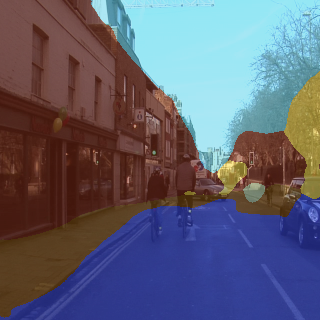

2/5 /content/drive/MyDrive/Assignment 3/sample/images/0016E5_07961.png


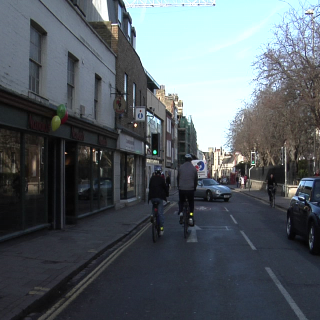

Ground Truth in the form of segmentation mask:


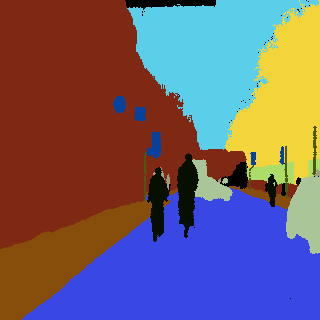

Ground Truth image Super-imposed on original image


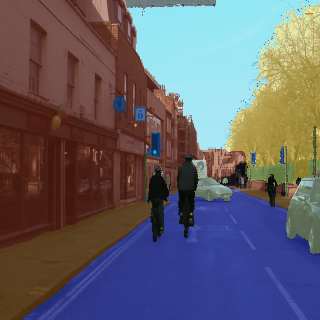

Pridicted Image mask:


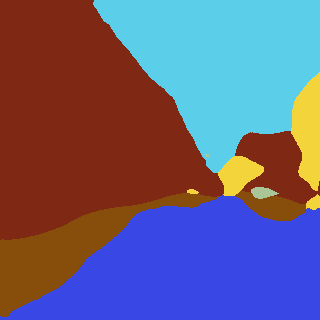

Predicted image Super-imposed on original image


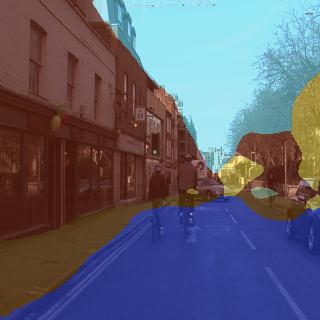

3/5 /content/drive/MyDrive/Assignment 3/sample/images/0016E5_07963.png


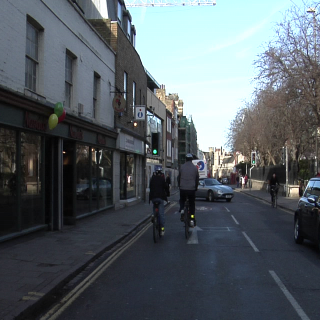

Ground Truth in the form of segmentation mask:


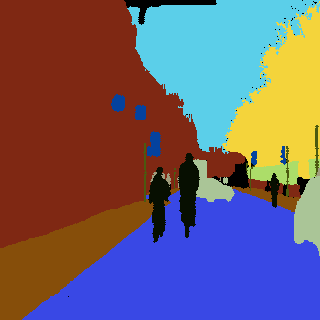

Ground Truth image Super-imposed on original image


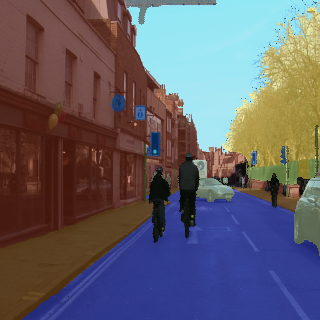

Pridicted Image mask:


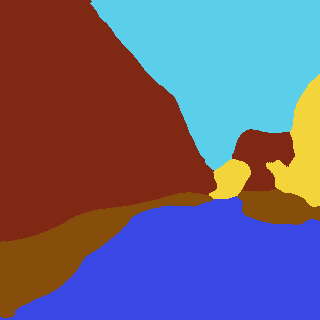

Predicted image Super-imposed on original image


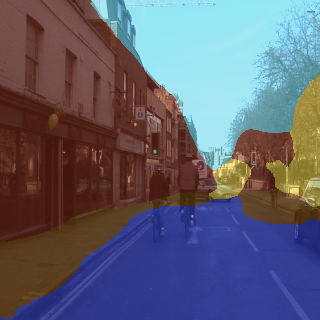

4/5 /content/drive/MyDrive/Assignment 3/sample/images/0016E5_08087.png


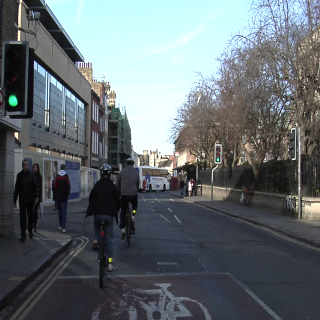

Ground Truth in the form of segmentation mask:


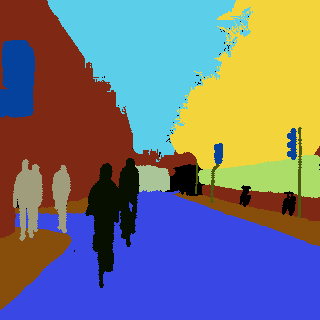

Ground Truth image Super-imposed on original image


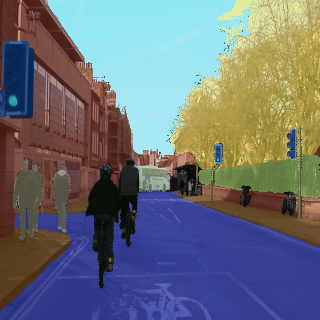

Pridicted Image mask:


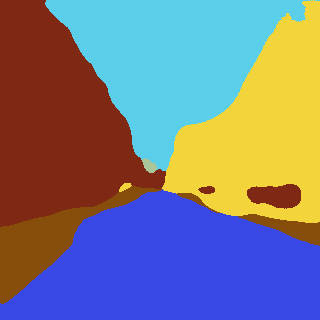

Predicted image Super-imposed on original image


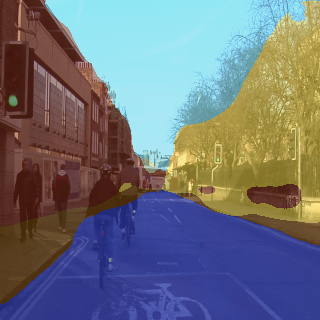

5/5 /content/drive/MyDrive/Assignment 3/sample/images/0016E5_08159.png


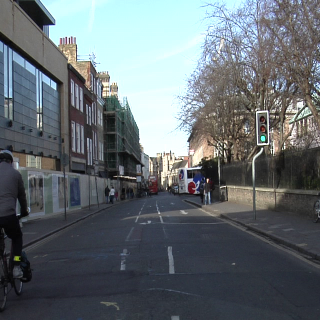

Ground Truth in the form of segmentation mask:


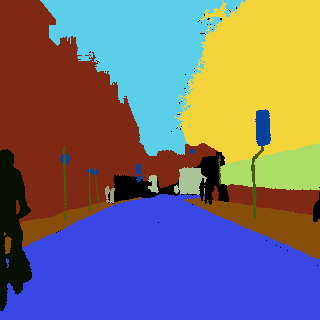

Ground Truth image Super-imposed on original image


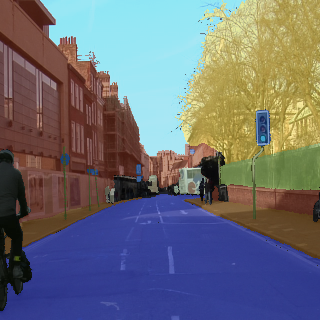

Pridicted Image mask:


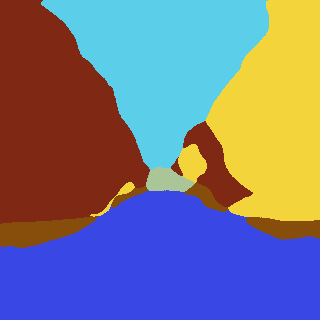

Predicted image Super-imposed on original image


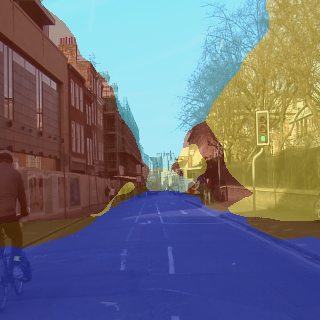

In [21]:

for i, (imgName, segName) in enumerate(zip(images, segmentations)):

    print("%d/%d %s" % (i + 1, len(images), imgName))

    im = cv2.imread(imgName, 1)
    # im=cv2.resize(im,(input_height,input_width))
    xx, yy = getcenteroffset(im.shape, input_height, input_width)
    im = im[xx:xx + input_height, yy:yy + input_width, :]

    seg = cv2.imread(segName, 0)
    # seg= cv2.resize(seg,interpolation=cv2.INTER_NEAREST)
    seg = seg[xx:xx + input_height, yy:yy + input_width]

    pr = UNet_XCeption.predict(np.expand_dims(getImageArr(im), 0))[0]
    pr = pr.reshape((input_height, input_width, n_classes)).argmax(axis=2)

    cv2_imshow( im)
    pr_mask = label2color(colors, n_classes, pr)
    im_mask = label2color(colors, n_classes, seg)

    print ('Ground Truth in the form of segmentation mask:')
    cv2_imshow (im_mask)
    print ('Ground Truth image Super-imposed on original image')
    dst = cv2.addWeighted(im_mask, 0.5, im, 0.5, 0)
    cv2_imshow (dst)
    print ('Pridicted Image mask:')
    cv2_imshow(pr_mask )
    print ('Predicted image Super-imposed on original image')
    dst = cv2.addWeighted(pr_mask, 0.5, im, 0.5, 0)
    cv2_imshow (dst)

# Comparing CNN Models:

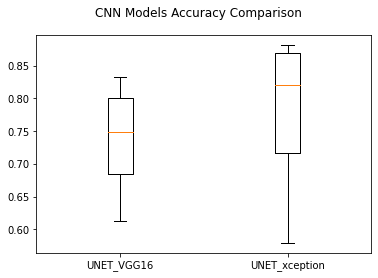

In [32]:
# Compare Algorithms
import pandas
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

model1 = load_model('/content/drive/MyDrive/Assignment 3/UNET_VGG16.h5', custom_objects=dependencies)
model2 = load_model('/content/drive/MyDrive/Assignment 3/unet_xception.h5', custom_objects=dependencies)
models = []
models.append(('UNET_VGG16', model1))
models.append(('UNET_xception', model2))

results = []
names = []
scoring = 'accuracy'
for name, model in models:
	his=np.load('/content/drive/MyDrive/Assignment 3/'+name+'_hist.npy',allow_pickle='TRUE').item()
	results.append(his['acc'])
	names.append(name)

# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('CNN Models Accuracy Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()